## Лабораторная работа 4.
### Выделение контуров на изображении

ФИО: Монастырный Максим Александрович

Группа: Б24-501 

Вариант 11

Оператор Круна 3х3

G = Евклидово расстояние

In [1]:
from pathlib import Path

import numpy as np
from PIL import Image

In [2]:
data_dir = Path("../data")

Исходное изображение

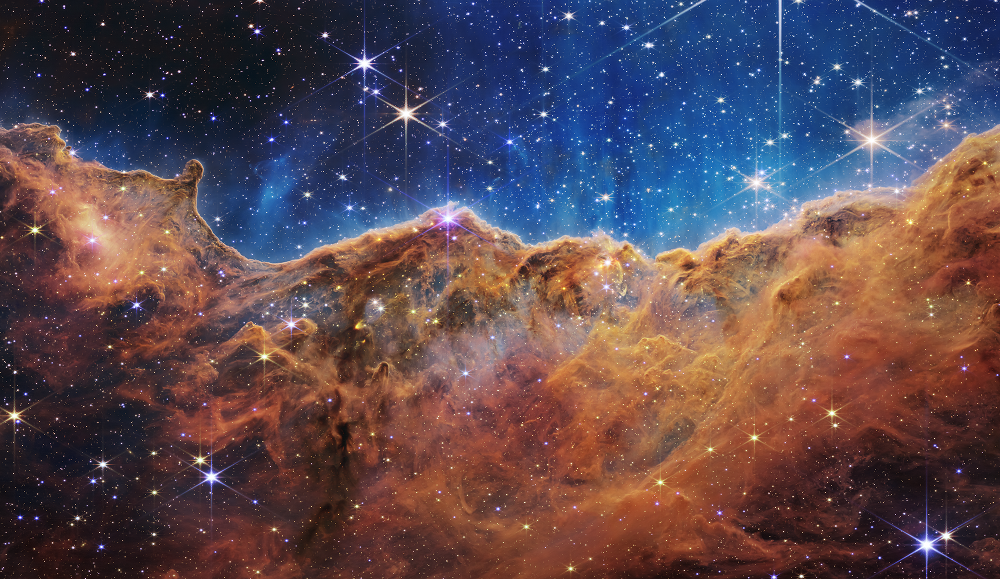

In [3]:
image_path = data_dir / "test_image.png"
raw_image = Image.open(image_path)
source_image = np.array(raw_image)
raw_image

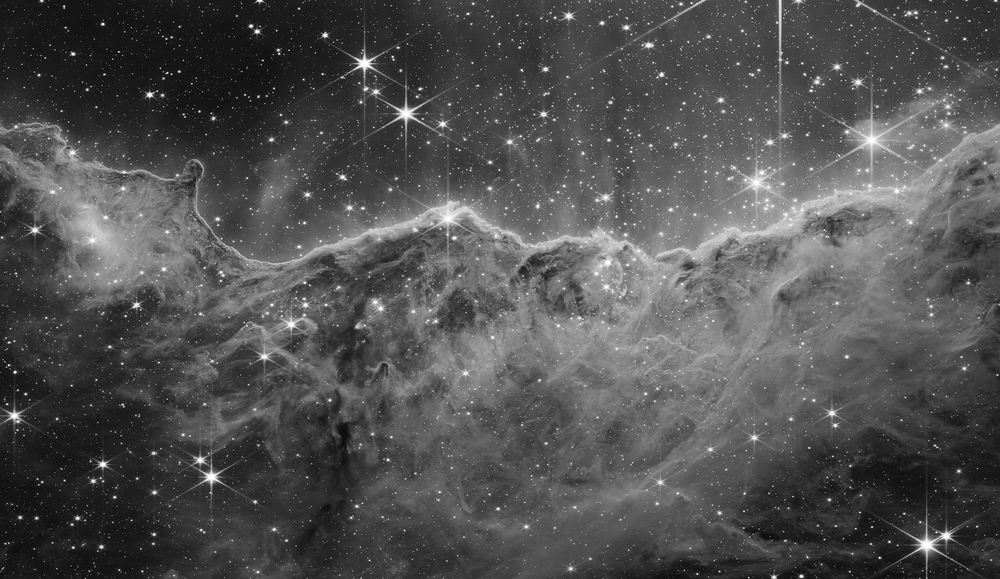

In [4]:
grayscale_image = Image.fromarray(np.average(source_image, axis=-1).astype(np.uint8))
grayscale_image

In [5]:
grayscale_image = np.array(grayscale_image)

In [6]:
g_x = np.array(
    [
        [17, 61, 17],
        [0, 0, 0],
        [-17, -61, -17],
    ],
    dtype=float,
)

g_y = np.array(
    [
        [17, 0, -17],
        [61, 0, -61],
        [17, 0, -17],
    ],
    dtype=float,
)

In [7]:
def conv(
    image: np.ndarray,
    kernel: np.ndarray,
    padding_mode: str = "symmetric",
    normalize: bool = True,
    threshold: float = None,
) -> np.ndarray:
    """
    Applies a convolution operation to an input image using the provided kernel.

    Args:
        image (np.ndarray): The input image as a 2D NumPy array.
        kernel (np.ndarray): The convolution kernel as a 2D NumPy array.
        padding_mode (str, optional): The mode of padding to use. Defaults to "symmetric".
        normalize (bool, optional): Whether to normalize the output values. Defaults to True.
        threshold (float, optional): If provided, applies a threshold to the output values.

    Raises:
        TypeError: If `image` or `kernel` is not a NumPy array.
        ValueError: If `padding_mode` is not one of "symmetric", "constant", "edge", or "reflect".
        ValueError: If `threshold` is not None and is less than 0 and greater than 255.
    Returns:
        np.ndarray: The convolved image as a 2D NumPy array.
    """
    if not isinstance(image, np.ndarray) or image.ndim != 2:
        raise TypeError("image must be a 2D NumPy array")
    if not isinstance(kernel, np.ndarray) or kernel.ndim != 2:
        raise TypeError("mask must be a 2D NumPy array")
    if not np.issubdtype(image.dtype, np.number):
        raise TypeError("image must have a numeric dtype")
    if not np.issubdtype(kernel.dtype, np.number):
        raise TypeError("mask must have a numeric dtype")

    kernel_height, kernel_width = kernel.shape
    height, width = image.shape
    pad_height, pad_width = kernel_height // 2, kernel_width // 2

    padded = np.pad(
        image,
        ((pad_height, pad_height), (pad_width, pad_width)),
        mode=padding_mode,
    )

    windows = np.lib.stride_tricks.sliding_window_view(
        padded,
        window_shape=(kernel_height, kernel_width),
    )

    kernel_repeated = np.tile(
        kernel[np.newaxis, np.newaxis, :, :],
        (height, width, 1, 1),
    )
    output_image = (windows * kernel_repeated).sum(axis=(-2, -1))

    if normalize:
        max_uint8 = 255
        min_image = output_image.min()
        output_image = (
            max_uint8 * (output_image - min_image) / (output_image.max() - min_image)
        ).astype(np.uint8)
        if threshold is not None:
            if not 0 < threshold < max_uint8:
                raise ValueError("Threshold must be between 0 and 255")

            output_image = np.where(output_image >= threshold, max_uint8, 0).astype(
                np.uint8
            )
    return output_image

In [8]:
g_x_image = Image.fromarray(conv(grayscale_image, g_x))

In [9]:
g_x_image.save(data_dir / "g_x_image.bmp")

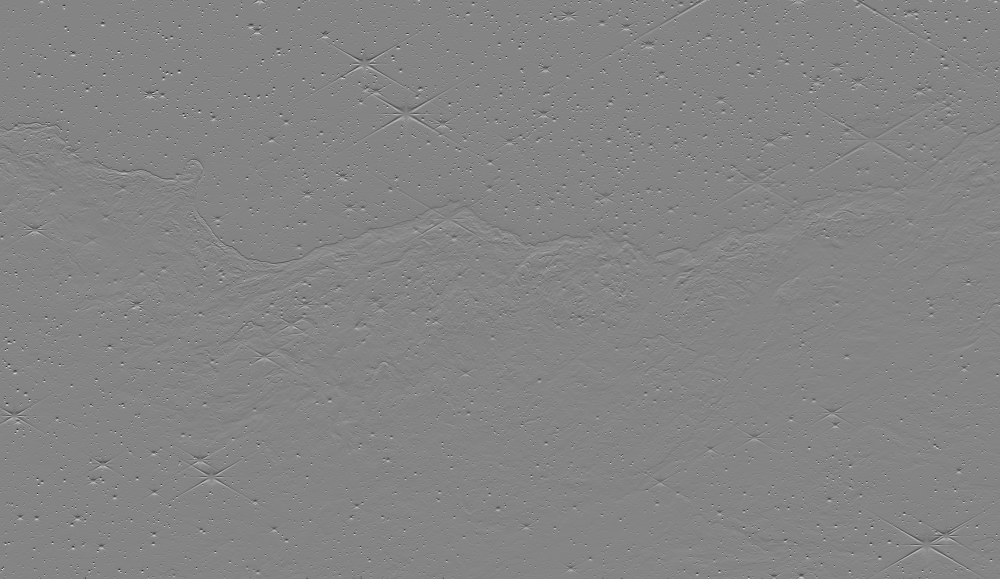

In [10]:
Image.open(data_dir / "g_x_image.bmp")

In [11]:
g_y_image = Image.fromarray(conv(grayscale_image, g_y))

In [12]:
g_y_image.save(data_dir / "g_y_image.bmp")

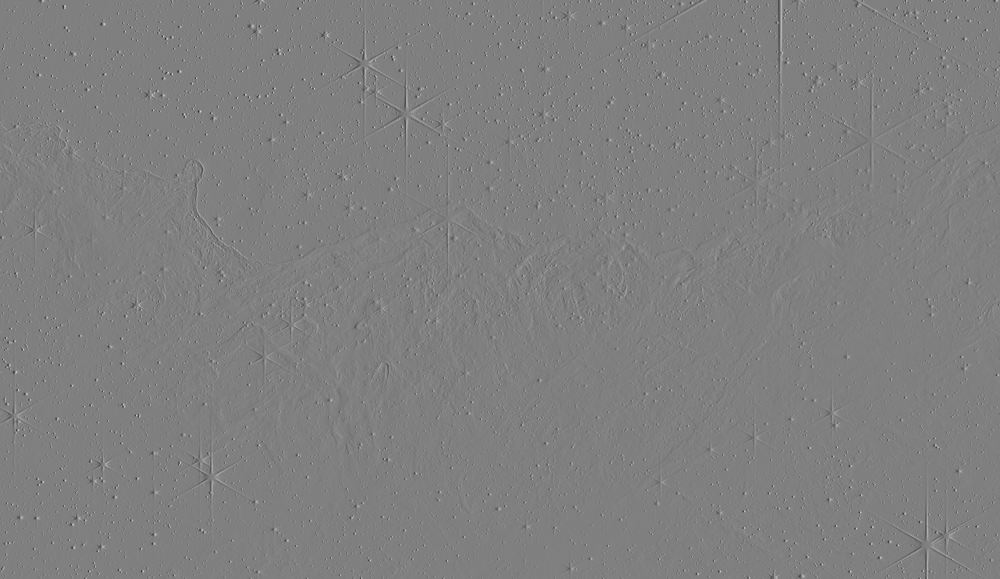

In [13]:
Image.open(data_dir / "g_y_image.bmp")

In [29]:
g_image = np.sqrt(np.array(g_x_image) ** 2 + np.array(g_y_image) ** 2)

max_uint8 = 255
min_image = g_image.min()
g_image = max_uint8 * (g_image - min_image) / (g_image.max() - min_image)

g_image = Image.fromarray(g_image.astype(np.uint8))

In [30]:
g_image.save(data_dir / "g_image.bmp")

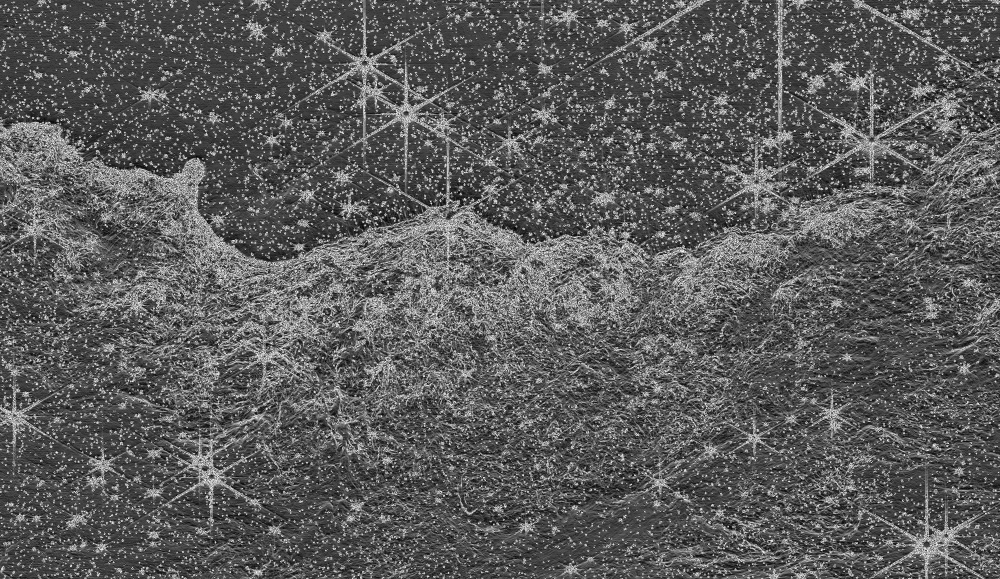

In [31]:
Image.open(data_dir / "g_image.bmp")

In [51]:
threshold = 192
binarized_g_image = np.array(g_image)
binarized_g_image = np.where(binarized_g_image > threshold, 255, 0)
binarized_g_image = Image.fromarray(binarized_g_image.astype(np.uint8))

In [52]:
binarized_g_image.save(data_dir / "binarized_g_image.bmp")

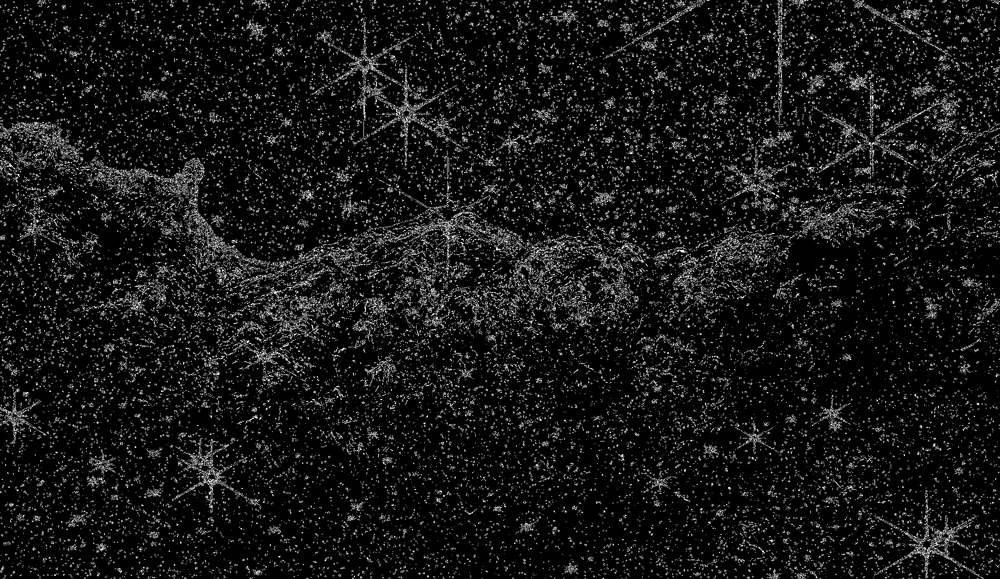

In [53]:
Image.open(data_dir / "binarized_g_image.bmp")